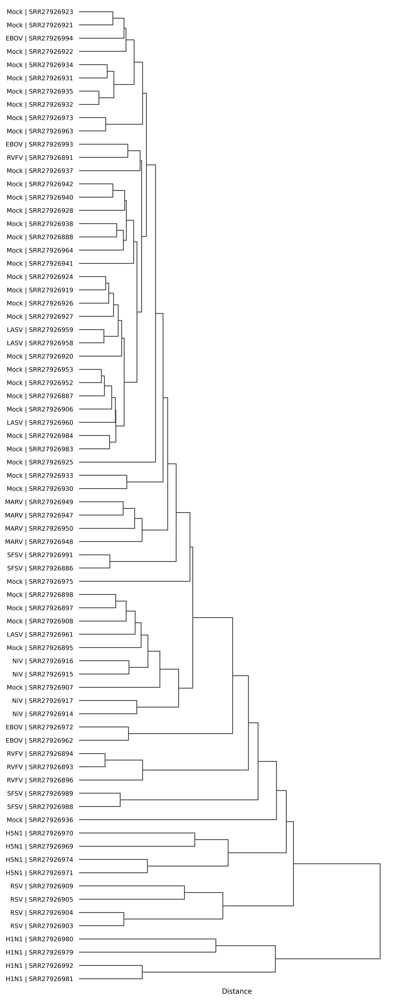

In [123]:
# Figure 1
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram

DATA_CSV = r"C:/Users/DIR/Jupyter/Multi-strain classification/dataset-2/top100_tpm_filtered.csv"

# What to show as the leaf labels:
LABEL_MODE = "virus|run"   # options: "virus", "run", "virus|run", "virus|hpi|run"

# Clustering settings:
METHOD = "average"         # "average", "ward", "complete", "single"
METRIC = "euclidean"       # "euclidean", "cosine", "correlation"

# Figure settings:
LINE_COLOR = "#444444"     # color for all branches
LINE_WIDTH = 1.0
FONTSIZE = 9               # leaf label font size
ORIENTATION = "right"      # "top", "bottom", "left", "right"
SAVE_PNG = r"C:/Users/DIR/Jupyter/Multi-strain classification/figures/fig1_b.png"

# Load data
df = pd.read_csv(DATA_CSV)
meta_cols = ["Run", "Library Name", "Virus", "HPI"]
gene_cols = [c for c in df.columns if c not in meta_cols]

# Build labels
if LABEL_MODE == "virus":
    labels = df["Virus"].astype(str).tolist()
elif LABEL_MODE == "run":
    labels = df["Run"].astype(str).tolist()
elif LABEL_MODE == "virus|hpi|run":
    labels = (df["Virus"].astype(str) + " | " +
              df["HPI"].astype(str) + " | " +
              df["Run"].astype(str)).tolist()
else:
    # default "virus|run"
    labels = (df["Virus"].astype(str) + " | " +
              df["Run"].astype(str)).tolist()

# Matrix: samples × genes
X = df[gene_cols].to_numpy(dtype=float)

# Handle missing values (impute each gene with its column mean)
col_means = np.nanmean(X, axis=0, keepdims=True)
inds = np.where(np.isnan(X))
X[inds] = np.take(col_means, inds[1])

std = X.std(axis=0, ddof=0)
keep = std > 0
X = X[:, keep]
std = std[keep]

Xz = (X - X.mean(axis=0, keepdims=True)) / std

# Linkage
if METHOD.lower() == "ward":
    Z = linkage(Xz, method="ward")
else:
    Z = linkage(Xz, method=METHOD, metric=METRIC)

# Plot
n = Xz.shape[0]
fig_h = max(4.0, 0.25 * n + 1.5)   
fig_w = 8.0 if ORIENTATION in ("left", "right") else max(8.0, 0.18 * n + 3.0)

fig, ax = plt.subplots(figsize=(fig_w, fig_h), dpi=300)

dendrogram(
    Z,
    labels=labels,
    orientation=ORIENTATION,
    color_threshold=0.0,                
    above_threshold_color=LINE_COLOR,
    link_color_func=lambda k: LINE_COLOR,
    leaf_font_size=FONTSIZE,
    ax=ax,
)

# Clean up axes
ax.set_xticks([])
if ORIENTATION in ("left", "right"):
    ax.set_xlabel("Distance", fontsize=10)
else:
    ax.set_ylabel("Distance", fontsize=10)

for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.savefig(SAVE_PNG, bbox_inches="tight")
plt.show()


C:\Users\DIR\AppData\Local\Temp\ipykernel_24740\2344223433.py:175: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


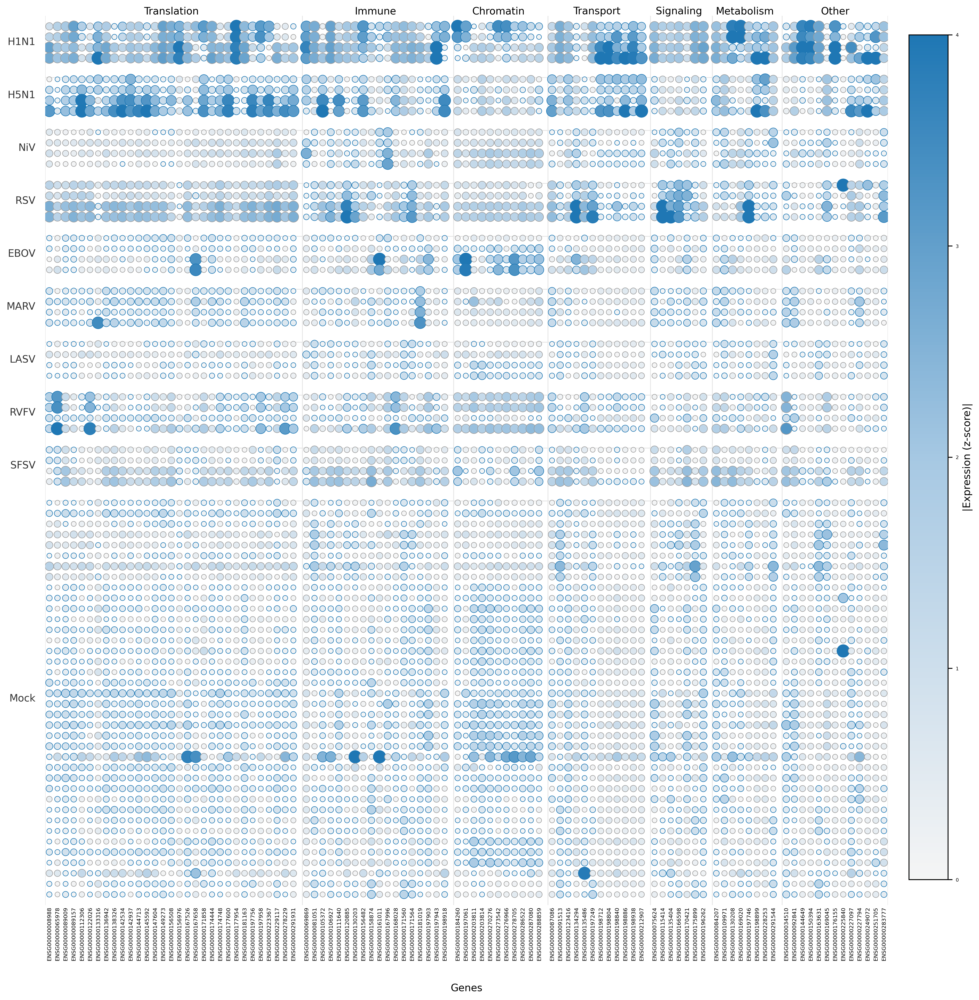

In [122]:
# Figure 2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, Normalize
from matplotlib.cm import ScalarMappable

DATA_CSV = r"C:/Users/DIR/Jupyter/Multi-strain classification/dataset-2/top100_tpm_filtered.csv"
MART_TXT = r"C:/Users/DIR/Jupyter/Multi-strain classification/dataset-2/mart_export.txt"
OUT_PNG  = r"C:/Users/DIR/Jupyter/Multi-strain classification/figures/fig1_a.png"
VIRUS_ORDER = ["H1N1", "H5N1", "NiV", "RSV", "EBOV", "MARV", "LASV", "RVFV", "SFSV", "Mock"]

df = pd.read_csv(DATA_CSV)
meta_cols = ["Run", "Library Name", "Virus", "HPI"]
gene_cols = [c for c in df.columns if c not in meta_cols]

def assign_category(go_terms: str) -> str:
    s = go_terms.lower()
    if ("immune" in s) or ("defense" in s): return "Immune"
    elif ("ribosome" in s) or ("translation" in s): return "Translation"
    elif ("metabolic" in s) or ("biosynthetic" in s): return "Metabolism"
    elif ("signaling" in s) or ("kinase" in s): return "Signaling"
    elif "transport" in s: return "Transport"
    elif ("chromatin" in s) or ("nucleosome" in s) or ("telomere" in s): return "Chromatin"
    else: return "Other"

gene_to_category = {g: "Other" for g in gene_cols}
try:
    mart = pd.read_csv(MART_TXT, delimiter=",").dropna(subset=["GO term name"])
    if "Gene name" in mart.columns and mart["Gene name"].isin(gene_cols).any():
        g2go = mart.groupby("Gene name")["GO term name"].apply(lambda x: "; ".join(sorted(set(x)))).to_dict()
        for g in gene_cols:
            if g in g2go: gene_to_category[g] = assign_category(g2go[g])
    else:
        g2go = mart.groupby("Gene stable ID")["GO term name"].apply(lambda x: "; ".join(sorted(set(x)))).to_dict()
        for g in gene_cols:
            if g in g2go: gene_to_category[g] = assign_category(g2go[g])
except Exception:
    pass  # unmatched genes remain "Other"

category_order = [
    "Translation","Immune","Chromatin","Transport","Signaling","Metabolism","Other"
]
ordered_genes, category_bounds = [], []
start = 0
for cat in category_order:
    genes_in_cat = sorted([g for g in gene_cols if gene_to_category.get(g, "Other") == cat])
    if genes_in_cat:
        ordered_genes.extend(genes_in_cat)
        end = start + len(genes_in_cat)
        category_bounds.append((cat, start, end))  # [start, end)
        start = end

if VIRUS_ORDER:
    extras = [v for v in df["Virus"].unique() if v not in VIRUS_ORDER]
    ordered_cats = VIRUS_ORDER + extras
    df["Virus"] = pd.Categorical(df["Virus"], categories=ordered_cats, ordered=True)

df_sorted = df.sort_values(["Virus", "HPI", "Run"], kind="stable").reset_index(drop=True)

X = df_sorted[ordered_genes].to_numpy(float)
mu = np.nanmean(X, axis=0, keepdims=True)
sd = np.nanstd(X, axis=0, ddof=0, keepdims=True); sd[sd == 0] = 1.0
Z = (X - mu) / sd

blue_grey = LinearSegmentedColormap.from_list("blue_grey", ["#f5f5f5", "#a6c8e3", "#1f77b4"])
z_abs = np.clip(np.abs(Z), 0, 4.0)
size = 28 + 160 * (z_abs / 4.0)                 # bubble size from |z|
norm = Normalize(vmin=0, vmax=4.0)
facecolors = blue_grey(norm(z_abs))             # bubble fill intensity by |z|
edges = np.where(Z >= 0, "#1f78b4", "#9e9e9e")  # up = blue edge, down = grey ring

virus_labels = df_sorted["Virus"].to_numpy()
sections = []
s = 0
for i in range(1, len(virus_labels) + 1):
    if i == len(virus_labels) or virus_labels[i] != virus_labels[s]:
        sections.append((virus_labels[s], s, i))   # [s, i)
        s = i

y_step_within = 1.5   # vertical spacing between samples in the same virus
y_gap_between = 1.5    # extra gap between virus groups

y_coords = np.zeros(len(df_sorted))
y_val = 0.0
for vname, a, b in sections:
    for i in range(a, b):
        y_coords[i] = y_val
        y_val += y_step_within
    y_val += y_gap_between

gap_x = 0.6
x_base = np.arange(len(ordered_genes)).astype(float)
x = x_base.copy()
cum = 0.0
for i, (cat, a, b) in enumerate(category_bounds):
    if i == 0: 
        continue
    cum += gap_x
    x[a:b] += cum
x_min, x_max = x[0] - 0.5, x[-1] + 0.5
y_min, y_max = -y_step_within, max(y_coords) + y_step_within

Xg, Yg = np.meshgrid(x, y_coords)
fig_h = max(9.0, 0.22 * len(df_sorted) + 3.0)   # a bit taller to fit labels
fig, ax = plt.subplots(figsize=(16, fig_h), dpi=300)

ax.scatter(
    Xg.ravel(), Yg.ravel(),
    s=size.ravel(),
    c=facecolors.reshape(-1, 4),
    edgecolors=edges.ravel(),
    linewidths=0.6
)

# No per-sample ticks
ax.set_yticks([])

# ---- Gene names at the bottom (vertical, small) ----
ax.set_xticks(x)
ax.set_xticklabels(ordered_genes, rotation=90, fontsize=6, ha="center", va="top")
ax.tick_params(axis="x", length=0, pad=2)   # no tick marks, tight pad
ax.set_xlabel("Genes", fontsize=11, labelpad=25)


ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.invert_yaxis()
for spine in ax.spines.values():
    spine.set_visible(False)

for vname, a, b in sections:
    y_mid = (y_coords[a] + y_coords[b - 1]) / 2.0
    ax.text(x_min - 1.2, y_mid, vname, ha="right", va="center",
            fontsize=11, fontweight="normal", color="#333333")
    if a > 0:
        ax.hlines(y_coords[a] - 0.5 * (y_step_within - 1),
                  x_min, x_max, colors="#e6e6e6", linewidth=0.9, zorder=0)

visible_headers = {"Translation", "Immune", "Chromatin", "Transport", "Signaling", "Metabolism", "Other"}

header_y = y_min + 0.08
for i, (cat, a, b) in enumerate(category_bounds):
    xa = x[a] - 0.5
    ax.vlines(xa, y_min, y_max, colors="#e6e6e6", lw=0.9, zorder=0)
    if cat in visible_headers:
        mid = (x[a] + x[b - 1]) / 2.0
        ax.text(mid, header_y, cat, ha="center", va="bottom", fontsize=11)
# rightmost border
ax.vlines(x[b - 1] + 0.5, y_min, y_max, colors="#e6e6e6", lw=0.9, zorder=0)

cax = fig.add_axes([1, 0.24, 0.037, 0.665])  # [right, bottom, width, height]
cb = plt.colorbar(ScalarMappable(norm=norm, cmap=blue_grey),
                  cax=cax, orientation="vertical")
cb.set_label("|Expression (z-score)|", fontsize=11)
cb.set_ticks([0, 1, 2, 3, 4])
cb.set_ticklabels(["0", "1", "2", "3", "4"])

plt.tight_layout()
# more bottom space to accommodate vertical gene labels + colorbar
plt.subplots_adjust(left=0.18, right=0.98, top=0.92, bottom=0.22)

plt.savefig(OUT_PNG, dpi=300, bbox_inches="tight")
plt.show()


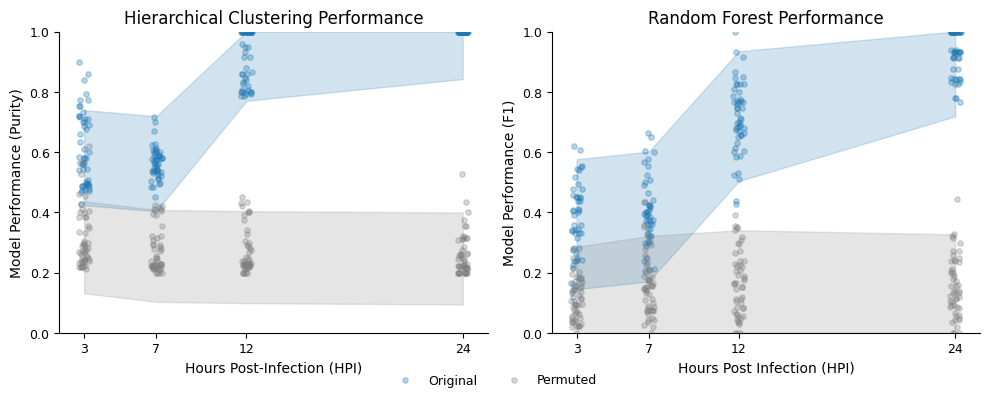

In [4]:
#Figure 3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

# --- Load Data ---
df_true = pd.read_csv("dataset-1/cluster_purities_true.csv")
df_perm = pd.read_csv("dataset-1/cluster_purities_permuted.csv")
rf_true = pd.read_csv("dataset-1/rf_metrics_true.csv")
rf_perm = pd.read_csv("dataset-1/rf_metrics_permuted.csv")

# --- Add label columns ---
df_true["Permute"] = "Original"
df_perm["Permute"] = "Permuted"
rf_true["Permute"] = "Original"
rf_perm["Permute"] = "Permuted"

# --- Combine ---
df_purity = pd.concat([df_true, df_perm], ignore_index=True)
df_rf = pd.concat([rf_true, rf_perm], ignore_index=True)

# --- Plot Setup ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharey=False)
palette = {'Original': '#1f77b4', 'Permuted': 'grey'}
timepoint_map = {"3h": 3, "7h": 7, "12h": 12, "24h": 24}
xticks = [3, 7, 12, 24]

handles = []
labels = []

# --- Left Panel: Cluster Purity ---
for cond in ["Original", "Permuted"]:
    subset = df_purity[df_purity["Permute"] == cond]
    xvals = subset["time"].map(timepoint_map).values
    yvals = subset["purity"].values
    jitter = np.random.uniform(-0.3, 0.3, size=len(xvals))
    sc = ax1.scatter(xvals + jitter, yvals, alpha=0.3, s=15, color=palette[cond], label=cond)

    lo = lowess(yvals, xvals, frac=0.3, return_sorted=True)
    xs, ys = lo[:, 0], lo[:, 1]
    resid = yvals - np.interp(xvals, xs, ys)
    ci = 1.96 * resid.std()
    ax1.fill_between(xs, np.clip(ys - ci, 0, 1), np.clip(ys + ci, 0, 1),
                     color=palette[cond], alpha=0.2)

    if cond not in labels:  # Save handle/label only once
        handles.append(sc)
        labels.append(cond)

ax1.set_title("Hierarchical Clustering Performance", fontsize=12)
ax1.set_xlabel("Hours Post-Infection (HPI)", fontsize=10)
ax1.set_ylabel("Model Performance (Purity)", fontsize=10)
ax1.set_xticks(xticks)
ax1.set_ylim(0, 1)
ax1.spines[['top', 'right']].set_visible(False)
ax1.tick_params(labelsize=9)

# --- Right Panel: RF F1 Score ---
for cond in ["Original", "Permuted"]:
    subset = df_rf[df_rf["Permute"] == cond]
    rf_grouped = subset.groupby(["time", "rep"])["f1"].mean().reset_index()
    xvals_rf = rf_grouped["time"].map(timepoint_map).values
    yvals_rf = rf_grouped["f1"].values
    jitter = np.random.uniform(-0.3, 0.3, size=len(xvals_rf))
    ax2.scatter(xvals_rf + jitter, yvals_rf, alpha=0.3, s=15, color=palette[cond])

    lo_rf = lowess(yvals_rf, xvals_rf, frac=0.3, return_sorted=True)
    xs_rf, ys_rf = lo_rf[:, 0], lo_rf[:, 1]
    resid_rf = yvals_rf - np.interp(xvals_rf, xs_rf, ys_rf)
    ci_rf = 1.96 * resid_rf.std()
    ax2.fill_between(xs_rf, np.clip(ys_rf - ci_rf, 0, 1), np.clip(ys_rf + ci_rf, 0, 1),
                     color=palette[cond], alpha=0.2)

ax2.set_title("Random Forest Performance", fontsize=12)
ax2.set_xlabel("Hours Post Infection (HPI)", fontsize=10)
ax2.set_ylabel("Model Performance (F1)", fontsize=10)
ax2.set_xticks(xticks)
ax2.set_ylim(0, 1)
ax2.spines[['top', 'right']].set_visible(False)
ax2.tick_params(labelsize=9)

# --- Shared Legend Below ---
fig.legend(handles, labels, loc='lower center', ncol=2, fontsize=9, frameon=False)
fig.tight_layout(rect=[0, 0.01, 1, 1])  # leave space for legend

# --- Save & Show ---
fig.savefig("C:/Users/DIR/Jupyter/Multi-strain classification/figures/fig2.png", dpi=300)
plt.show()


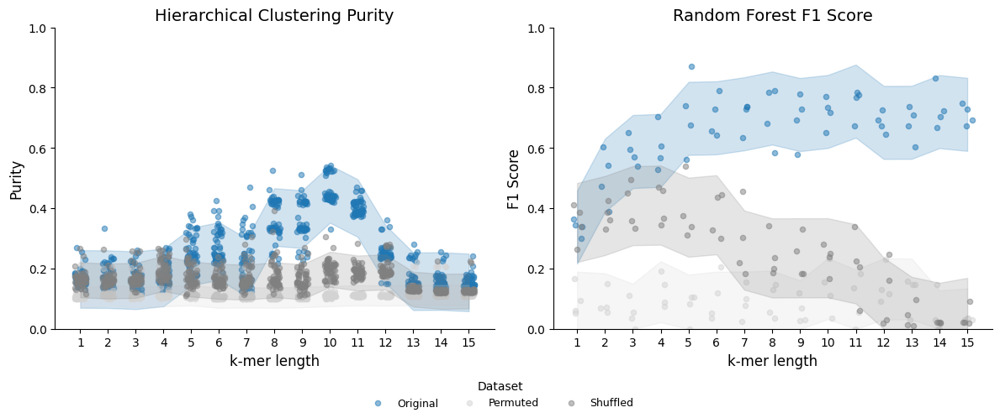

In [1]:
#Figure 4
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

# Set paths
kmer_csv_dir = "C:/Users/DIR/Jupyter/Multi-strain classification/dataset-2/cluster_outputs/"
fig_output_path = "C:/Users/DIR/Jupyter/Multi-strain classification/figures/fig3.png"

# Load clustering data
orig_cluster = pd.read_csv(os.path.join(kmer_csv_dir, "cluster_replicates_Original.csv"))
perm_cluster = pd.read_csv(os.path.join(kmer_csv_dir, "cluster_replicates_Original_permuted.csv"))
shuff_cluster = pd.read_csv(os.path.join(kmer_csv_dir, "cluster_replicates_Original_shuffled.csv"))

orig_cluster["Dataset"] = "Original"
perm_cluster["Dataset"] = "Permuted"
shuff_cluster["Dataset"] = "Shuffled"

df_cluster = pd.concat([orig_cluster, perm_cluster, shuff_cluster], ignore_index=True)
df_cluster = df_cluster[df_cluster['k'].between(1, 15)]

# Load RF data
rf_dfs = []
rf_labels = {
    "Original": "rf_folds_Original.csv",
    "Permuted": "rf_folds_Original_permuted.csv",
    "Shuffled": "rf_folds_Original_shuffled.csv"
}

for label, filename in rf_labels.items():
    path = os.path.join(kmer_csv_dir, filename)
    if os.path.exists(path):
        df = pd.read_csv(path)
        df["Dataset"] = label
        rf_dfs.append(df)

rf_df = pd.concat(rf_dfs, ignore_index=True)
rf_df = rf_df[rf_df['k'].between(1, 15)]

# Color palette
palette = {'Original': '#1f77b4', 'Permuted': 'lightgrey', 'Shuffled': 'grey'}

# Set up figure
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=False)

# Left panel — Clustering Purity
for cond in ['Original', 'Permuted', 'Shuffled']:
    subset = df_cluster[df_cluster['Dataset'] == cond]
    if subset.empty:
        continue
    lo = lowess(subset['purity'], subset['k'], frac=0.2, return_sorted=True)
    xs, ys = lo[:, 0], lo[:, 1]
    resid = subset['purity'] - np.interp(subset['k'], xs, ys)
    ci = 1.96 * resid.std()
    axes[0].fill_between(xs, np.clip(ys - ci, 0, 1), np.clip(ys + ci, 0, 1), color=palette[cond], alpha=0.2)
    xjit = subset['k'] + (np.random.rand(len(subset)) - 0.5) * 0.4
    axes[0].scatter(xjit, subset['purity'], alpha=0.5, s=20, color=palette[cond], label=cond)

axes[0].set_title('Hierarchical Clustering Purity', fontsize=14)
axes[0].set_xlabel('k-mer length', fontsize=12)
axes[0].set_ylabel('Purity', fontsize=12)
axes[0].set_xticks(sorted(df_cluster['k'].unique()))
axes[0].set_ylim(0, 1)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# Right panel — RF F1 Score
for cond in ['Original', 'Permuted', 'Shuffled']:
    subset = rf_df[rf_df['Dataset'] == cond]
    if subset.empty or "f1" not in subset.columns:
        continue
    lo = lowess(subset['f1'], subset['k'], frac=0.2, return_sorted=True)
    xs, ys = lo[:, 0], lo[:, 1]
    resid = subset['f1'] - np.interp(subset['k'], xs, ys)
    ci = 1.96 * resid.std()
    axes[1].fill_between(xs, np.clip(ys - ci, 0, 1), np.clip(ys + ci, 0, 1), color=palette[cond], alpha=0.2)
    xjit = subset['k'] + (np.random.rand(len(subset)) - 0.5) * 0.4
    axes[1].scatter(xjit, subset['f1'], alpha=0.5, s=20, color=palette[cond], label=cond)

axes[1].set_title('Random Forest F1 Score', fontsize=14)
axes[1].set_xlabel('k-mer length', fontsize=12)
axes[1].set_ylabel('F1 Score', fontsize=12)
axes[1].set_xticks(sorted(rf_df['k'].unique()))
axes[1].set_ylim(0, 1)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# Finalize
fig.tight_layout(rect=[0, 0.08, 1, 1])  # adjust bottom margin for legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title='Dataset', loc='lower center', ncol=3, fontsize=9, title_fontsize=10, frameon=False)

fig.savefig(fig_output_path, dpi=300)
plt.show()



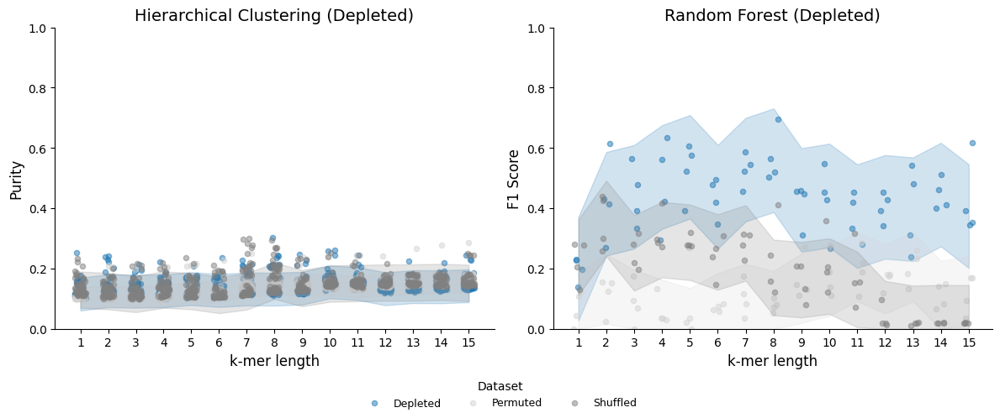

In [2]:
#Figure 5
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

kmer_csv_dir = "C:/Users/DIR/Jupyter/Multi-strain classification/dataset-2/cluster_outputs/"
fig_output_path = "C:/Users/DIR/Jupyter/Multi-strain classification/figures/fig4.png"
depl = pd.read_csv(os.path.join(kmer_csv_dir, "cluster_replicates_Depleted.csv"))
depl_perm = pd.read_csv(os.path.join(kmer_csv_dir, "cluster_replicates_Depleted_permuted.csv"))
depl_shuff = pd.read_csv(os.path.join(kmer_csv_dir, "cluster_replicates_Depleted_shuffled.csv"))

depl["Dataset"] = "Depleted"
depl_perm["Dataset"] = "Permuted"
depl_shuff["Dataset"] = "Shuffled"

df_cluster = pd.concat([depl, depl_perm, depl_shuff], ignore_index=True)
df_cluster = df_cluster[df_cluster["k"].between(1, 15)]

rf_files = {
    "Depleted": "rf_folds_Depleted.csv",
    "Permuted": "rf_folds_Depleted_permuted.csv",
    "Shuffled": "rf_folds_Depleted_shuffled.csv"
}

rf_dfs = []
for label, fname in rf_files.items():
    path = os.path.join(kmer_csv_dir, fname)
    if os.path.exists(path):
        df = pd.read_csv(path)
        df["Dataset"] = label
        rf_dfs.append(df)

rf_df = pd.concat(rf_dfs, ignore_index=True)
rf_df = rf_df[rf_df["k"].between(1, 15)]

palette = {"Depleted": "#1f77b4", "Permuted": "lightgrey", "Shuffled": "grey"}
datasets = ["Depleted", "Permuted", "Shuffled"]

fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=False)

for cond in datasets:
    subset = df_cluster[df_cluster["Dataset"] == cond]
    if subset.empty:
        continue
    lo = lowess(subset["purity"], subset["k"], frac=0.2, return_sorted=True)
    xs, ys = lo[:, 0], lo[:, 1]
    resid = subset["purity"] - np.interp(subset["k"], xs, ys)
    ci = 1.96 * resid.std()

    axes[0].fill_between(xs, np.clip(ys - ci, 0, 1), np.clip(ys + ci, 0, 1),
                         color=palette[cond], alpha=0.2)
    xjit = subset["k"] + (np.random.rand(len(subset)) - 0.5) * 0.4
    axes[0].scatter(xjit, subset["purity"], alpha=0.5, s=20, color=palette[cond], label=cond)

axes[0].set_title("Hierarchical Clustering (Depleted)", fontsize=14)
axes[0].set_xlabel("k-mer length", fontsize=12)
axes[0].set_ylabel("Purity", fontsize=12)
axes[0].set_xticks(sorted(df_cluster["k"].unique()))
axes[0].set_ylim(0, 1)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

for cond in datasets:
    subset = rf_df[rf_df["Dataset"] == cond]
    if subset.empty or "f1" not in subset.columns:
        continue
    lo = lowess(subset["f1"], subset["k"], frac=0.2, return_sorted=True)
    xs, ys = lo[:, 0], lo[:, 1]
    resid = subset["f1"] - np.interp(subset["k"], xs, ys)
    ci = 1.96 * resid.std()

    axes[1].fill_between(xs, np.clip(ys - ci, 0, 1), np.clip(ys + ci, 0, 1),
                         color=palette[cond], alpha=0.2)
    xjit = subset["k"] + (np.random.rand(len(subset)) - 0.5) * 0.4
    axes[1].scatter(xjit, subset["f1"], alpha=0.5, s=20, color=palette[cond], label=cond)

axes[1].set_title("Random Forest (Depleted)", fontsize=14)
axes[1].set_xlabel("k-mer length", fontsize=12)
axes[1].set_ylabel("F1 Score", fontsize=12)
axes[1].set_xticks(sorted(rf_df["k"].unique()))
axes[1].set_ylim(0, 1)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

fig.tight_layout(rect=[0, 0.08, 1, 1])
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title="Dataset", loc="lower center", ncol=3, fontsize=9, title_fontsize=10, frameon=False)

fig.savefig(fig_output_path, dpi=300)
plt.show()


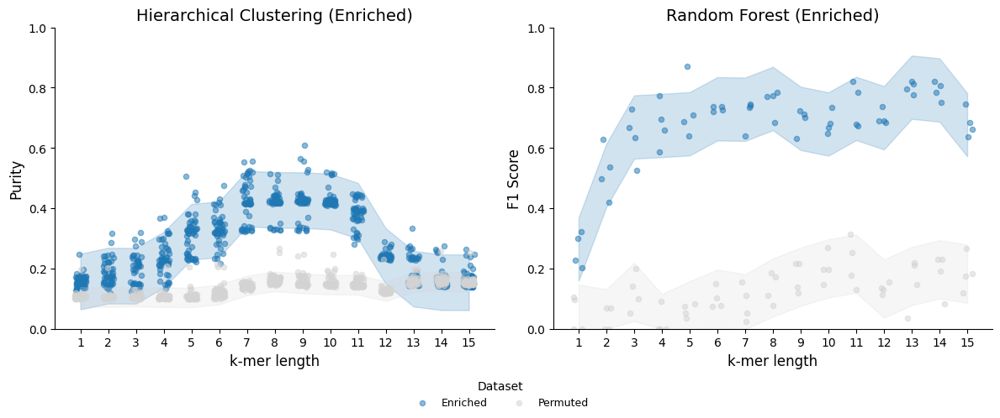

In [3]:
#Figure 6 
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess

kmer_csv_dir = "C:/Users/DIR/Jupyter/Multi-strain classification/dataset-2/cluster_outputs/"
fig_output_path = "C:/Users/DIR/Jupyter/Multi-strain classification/figures/fig5.png"

cluster_files = {
    "Enriched": "cluster_replicates_Enriched.csv",
    "Permuted": "cluster_replicates_Enriched_permuted.csv",
    "Shuffled": "cluster_replicates_Enriched_shuffled.csv"
}

cluster_dfs = []
for label, fname in cluster_files.items():
    path = os.path.join(kmer_csv_dir, fname)
    if os.path.exists(path):
        df = pd.read_csv(path)
        df["Dataset"] = label
        cluster_dfs.append(df)

df_cluster = pd.concat(cluster_dfs, ignore_index=True)
df_cluster = df_cluster[df_cluster["k"].between(1, 15)]

rf_files = {
    "Enriched": "rf_folds_Enriched.csv",
    "Permuted": "rf_folds_Enriched_permuted.csv",
    "Shuffled": "rf_folds_Enriched_shuffled.csv"
}

rf_dfs = []
for label, fname in rf_files.items():
    path = os.path.join(kmer_csv_dir, fname)
    if os.path.exists(path):
        df = pd.read_csv(path)
        df["Dataset"] = label
        rf_dfs.append(df)

rf_df = pd.concat(rf_dfs, ignore_index=True)
rf_df = rf_df[rf_df["k"].between(1, 15)]

palette = {
    "Enriched": "#1f77b4",   
    "Permuted": "lightgrey",
    "Shuffled": "grey"
}
datasets = ["Enriched", "Permuted", "Shuffled"]

fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=False)

for cond in datasets:
    subset = df_cluster[df_cluster["Dataset"] == cond]
    if subset.empty:
        continue
    lo = lowess(subset["purity"], subset["k"], frac=0.2, return_sorted=True)
    xs, ys = lo[:, 0], lo[:, 1]
    resid = subset["purity"] - np.interp(subset["k"], xs, ys)
    ci = 1.96 * resid.std()

    axes[0].fill_between(xs, np.clip(ys - ci, 0, 1), np.clip(ys + ci, 0, 1),
                         color=palette[cond], alpha=0.2)
    xjit = subset["k"] + (np.random.rand(len(subset)) - 0.5) * 0.4
    axes[0].scatter(xjit, subset["purity"], alpha=0.5, s=20, color=palette[cond], label=cond)

axes[0].set_title("Hierarchical Clustering (Enriched)", fontsize=14)
axes[0].set_xlabel("k-mer length", fontsize=12)
axes[0].set_ylabel("Purity", fontsize=12)
axes[0].set_xticks(sorted(df_cluster["k"].unique()))
axes[0].set_ylim(0, 1)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

for cond in datasets:
    subset = rf_df[rf_df["Dataset"] == cond]
    if subset.empty or "f1" not in subset.columns:
        continue
    lo = lowess(subset["f1"], subset["k"], frac=0.2, return_sorted=True)
    xs, ys = lo[:, 0], lo[:, 1]
    resid = subset["f1"] - np.interp(subset["k"], xs, ys)
    ci = 1.96 * resid.std()

    axes[1].fill_between(xs, np.clip(ys - ci, 0, 1), np.clip(ys + ci, 0, 1),
                         color=palette[cond], alpha=0.2)
    xjit = subset["k"] + (np.random.rand(len(subset)) - 0.5) * 0.4
    axes[1].scatter(xjit, subset["f1"], alpha=0.5, s=20, color=palette[cond], label=cond)

axes[1].set_title("Random Forest (Enriched)", fontsize=14)
axes[1].set_xlabel("k-mer length", fontsize=12)
axes[1].set_ylabel("F1 Score", fontsize=12)
axes[1].set_xticks(sorted(rf_df["k"].unique()))
axes[1].set_ylim(0, 1)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

fig.tight_layout(rect=[0, 0.08, 1, 1])
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, title="Dataset", loc="lower center", ncol=3, fontsize=9, title_fontsize=10, frameon=False)

fig.savefig(fig_output_path, dpi=300)
plt.show()


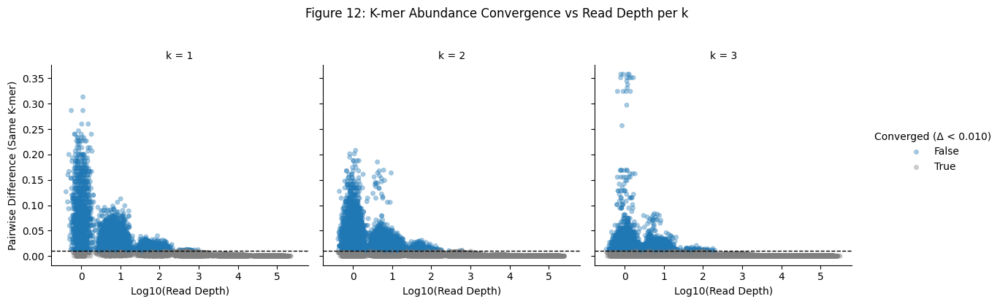

In [3]:
# Supplementary Figure 1

import pandas as pd
import numpy as np
from itertools import combinations
import seaborn as sns
import matplotlib.pyplot as plt

data_path = "C:/Users/DIR/Jupyter/Multi-strain classification/dataset-2/convergence/convergence_results.csv"
df = pd.read_csv(data_path)

DELTA = 0.01

diff_records = []

grouped = df.groupby(["num_reads", "k", "kmer"])["abundance"]

for (depth, k, kmer), abundances in grouped:
    vals = abundances.to_numpy()
    if len(vals) < 2:
        continue
    pairwise_diffs = [abs(vals[i] - vals[j]) for i, j in combinations(range(len(vals)), 2)]
    for diff in pairwise_diffs:
        diff_records.append({
            "num_reads": depth,
            "k": k,
            "kmer": kmer,
            "pairwise_diff": diff,
            "converged": diff < DELTA
        })

diff_df = pd.DataFrame(diff_records)
diff_df["log_reads"] = np.log10(diff_df["num_reads"])

jitter_strength = 0.12
np.random.seed(42)
diff_df["log_reads_jittered"] = diff_df["log_reads"] + np.random.normal(0, jitter_strength, size=len(diff_df))

g = sns.FacetGrid(
    diff_df,
    col="k",
    col_wrap=3,
    height=4,
    sharey=True
)

g.map_dataframe(
    sns.scatterplot,
    x="log_reads_jittered",
    y="pairwise_diff",
    hue="converged",
    palette={True: "grey", False: "#1f77b4"},
    alpha=0.4,
    s=20,
    edgecolor=None
)

for ax in g.axes.flat:
    ax.axhline(DELTA, ls="--", color="black", lw=1)

g.set_axis_labels("Log10(Read Depth)", "Pairwise Difference (Same K-mer)")
g.set_titles("k = {col_name}")
g.add_legend(title="Converged (Δ < {:.3f})".format(DELTA))
g.fig.suptitle("Figure 12: K-mer Abundance Convergence vs Read Depth per k", y=1.03)
g.tight_layout()
g.fig.savefig("C:/Users/DIR/Jupyter/Multi-strain classification/figures/supfig1.png", dpi=300, bbox_inches='tight')
plt.show()


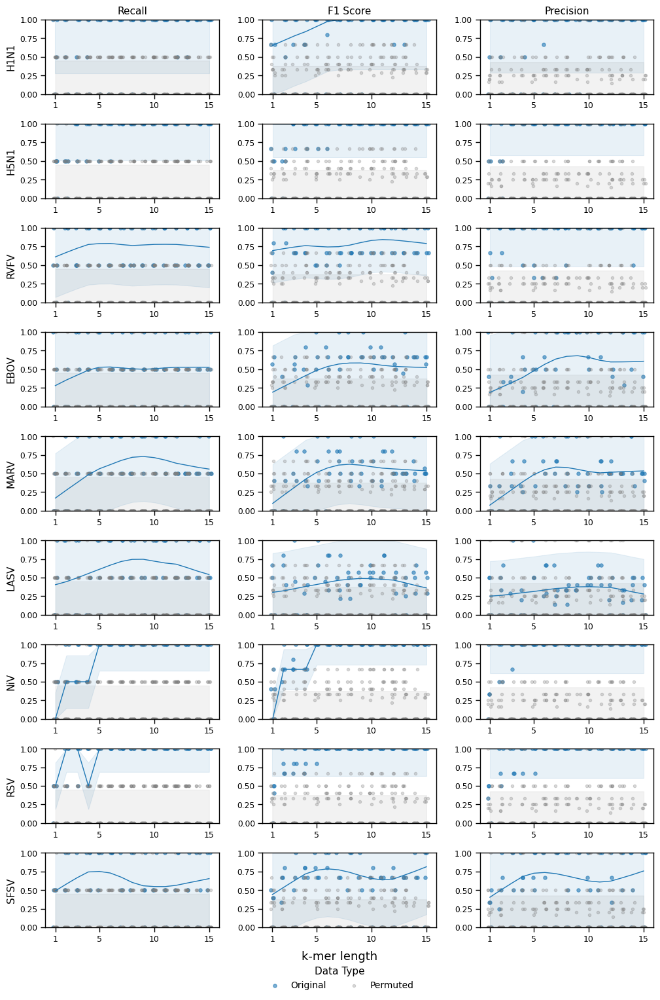

In [37]:
# Supplementary Figure 2
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess
import matplotlib.gridspec as gridspec

kmer_csv_dir = "C:/Users/DIR/Jupyter/Multi-strain classification/dataset-2/cluster_outputs/"
orig = pd.read_csv(os.path.join(kmer_csv_dir, "rf_folds_Original.csv"))
perm = pd.read_csv(os.path.join(kmer_csv_dir, "rf_folds_Original_permuted.csv"))

orig["Condition"] = "Original"
perm["Condition"] = "Permuted"
df = pd.concat([orig, perm], ignore_index=True)

virus_order = ["H1N1", "H5N1", "RVFV", "EBOV", "MARV", "LASV", "NiV", "RSV", "SFSV"]
sample_prefixes = [f"pc_{v}" for v in virus_order]
metrics = ["recall", "f1", "precision"]
metric_labels = {"f1": "F1 Score", "recall": "Recall", "precision": "Precision"}
markers = {"f1": "o", "recall": "o", "precision": "o"}
palette = {"Original": "#1f77b4", "Permuted": "grey"}

permuted_agg = {}
for metric in metrics:
    combined = []
    for prefix in sample_prefixes:
        col = f"{prefix}_{metric}"
        if col in perm.columns:
            temp = perm[["k", col]].copy()
            temp = temp.rename(columns={col: "value"})
            combined.append(temp)
    permuted_agg[metric] = pd.concat(combined).dropna()

nrows = len(sample_prefixes)
ncols = len(metrics)
fig = plt.figure(figsize=(12, 18))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, height_ratios=[1.2]*nrows, hspace=0.4, wspace=0.25)

axes = np.empty((nrows, ncols), dtype=object)
for r in range(nrows):
    for c in range(ncols):
        axes[r, c] = fig.add_subplot(gs[r, c])

for row_idx, prefix in enumerate(sample_prefixes):
    virus_label = prefix.replace("pc_", "")
    for col_idx, metric in enumerate(metrics):
        ax = axes[row_idx, col_idx]
        metric_col = f"{prefix}_{metric}"

        subset = orig[["k", metric_col]].dropna()
        if not subset.empty:
            lo = lowess(subset[metric_col], subset["k"], frac=0.5, return_sorted=True)
            xs, ys = lo[:, 0], lo[:, 1]
            resid = subset[metric_col] - np.interp(subset["k"], xs, ys)
            ci = 1.96 * resid.std()

            ax.fill_between(xs, np.clip(ys - ci, 0, 1), np.clip(ys + ci, 0, 1),
                            color=palette["Original"], alpha=0.1)
            xjit = subset["k"] + (np.random.rand(len(subset)) - 0.5) * 0.4
            ax.scatter(xjit, subset[metric_col], alpha=0.6, s=15,
                       color=palette["Original"], marker=markers[metric],
                       label="Original" if row_idx == 0 and col_idx == 0 else None)
            ax.plot(xs, ys, color=palette["Original"], linewidth=1)

        perm_data = permuted_agg[metric]
        if not perm_data.empty:
            lo = lowess(perm_data["value"], perm_data["k"], frac=0.5, return_sorted=True)
            xs, ys = lo[:, 0], lo[:, 1]
            resid = perm_data["value"] - np.interp(perm_data["k"], xs, ys)
            ci = 1.96 * resid.std()

            ax.fill_between(xs, np.clip(ys - ci, 0, 1), np.clip(ys + ci, 0, 1),
                            color=palette["Permuted"], alpha=0.1)
            xjit = perm_data["k"] + (np.random.rand(len(perm_data)) - 0.5) * 0.4
            ax.scatter(xjit, perm_data["value"], alpha=0.3, s=10,
                       color=palette["Permuted"], marker=markers[metric],
                       label="Permuted" if row_idx == 0 and col_idx == 0 else None)
            ax.plot(xs, ys, color=palette["Permuted"], linestyle='--', linewidth=1)

        if row_idx == 0:
            ax.set_title(metric_labels[metric], fontsize=11)
        if col_idx == 0:
            ax.set_ylabel(virus_label, fontsize=11)

        ax.set_ylim(0, 1)
        ax.set_xticks([1, 5, 10, 15])
        ax.set_xticklabels([1, 5, 10, 15], fontsize=9)
        ax.grid(False)

handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels,
           loc='lower center',
           bbox_to_anchor=(0.5, 0.05),
           ncol=2,
           title="Data Type",
           fontsize=10,
           title_fontsize=11,
           frameon=False)

fig.supxlabel("k-mer length", fontsize=13, y=0.08)

fig.savefig("C:/Users/DIR/Jupyter/Multi-strain classification/figures/fig6.png", dpi=300, bbox_inches="tight")
plt.show()
